# Visualize Maps

This notebook contains the code necessary to generate all 3D maps for the Pan 3D Genome project. I have organized this largely by order of appearance in the manuscript; however, a few sections may be out of order. Use the Table of Contents below to navigate to specific types of plots.

## Table of Contents

- [Load Packages and Run Initial Functions](#loadpackages)
- [Rotated Single Map](#rotatedsingle)
- [Rotated Map Comparison](#rotatedcomparison)
- [Rotated Map Comparison for IDWs with Causal Variant](#rotatedcomparisonIDW)
- [Rotated Map Comparison for IDWs with Causal Variant and Tracks](#rotatedcomparisonIDWtracks)

## Load Packages and Run Initial Functions <a class = 'anchor' id = 'loadpackages'></a>

Load packages.

In [1]:
from matplotlib import colors
from matplotlib.patches import Rectangle
from matplotlib.transforms import Affine2D
from mpl_toolkits.axisartist.grid_finder import DictFormatter
import json
import math
import matplotlib.font_manager as font_manager
import matplotlib.lines as mlines
import matplotlib.pyplot as plt
import mpl_toolkits.axisartist.floating_axes as floating_axes
import numpy as np
import pandas as pd

Set path to Arial font.

In [2]:
arial_path = '/wynton/home/capra/cbrand/miniconda3/envs/jupyter/fonts/Arial.ttf'
arial = font_manager.FontProperties(fname = arial_path)

Change directories.

In [3]:
cd ../../data

/wynton/group/capra/projects/pan_3d_genome/data


Set three initial functions for later.

In [4]:
def set_diag(arr, x, i=0):
    start = max(i, -arr.shape[1] * i)
    stop = max(0, (arr.shape[1] - i)) * arr.shape[1]
    step = arr.shape[1] + 1
    arr.flat[start:stop:step] = x
    return arr

In [5]:
def from_upper_triu(vector_repr, matrix_len, num_diags):
    z = np.zeros((matrix_len,matrix_len))
    triu_tup = np.triu_indices(matrix_len,num_diags)
    z[triu_tup] = vector_repr
    for i in range(-num_diags+1,num_diags):
        set_diag(z, np.nan, i)
    return z + z.T

Function for plot rotation. Adapted from: https://stackoverflow.com/questions/62357483/how-to-rotate-a-subplot-by-45-degree-in-matplotlib.

In [6]:
def setup_axes1(fig, rect, angle):
    tr = Affine2D().scale(2, 2).rotate_deg(angle)

    #We create dictionarys to keep the xticks and yticks after the rotation
    dictio={i:str(val) for i,val in enumerate(np.arange(-.5, 449, 10).tolist())}
    reversedictio={i:dictio[val] for i,val in enumerate(list(reversed(sorted(dictio.keys()))))}
    grid_helper = floating_axes.GridHelperCurveLinear(
        tr, extremes=(-0.5, 448.5,-0.5, 448.5), tick_formatter1= DictFormatter(dictio),
        tick_formatter2=DictFormatter(reversedictio))

    ax1 = floating_axes.FloatingSubplot(fig, rect, grid_helper=grid_helper)
    
    # remove axes
    ax1.axis("off")    
    ax1.axis["bottom"].set_visible(False)
    ax1.axis["top"].set_visible(False)
    ax1.axis["right"].set_visible(False)
    ax1.axis["left"].set_visible(False)


    fig.add_subplot(ax1) 
    aux_ax = ax1.get_aux_axes(tr)
    grid_helper.grid_finder.grid_locator1._nbins = 448    #Number of rows
    grid_helper.grid_finder.grid_locator2._nbins = 448    #Number of columns
    return aux_ax

## Rotated Single Map <a class = 'anchor' id = 'rotatedsingle'></a>

In [7]:
def onemap_rotated(ind1, chr, start):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1) # bottom-half
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T # transpose

    # rotate matrix and add color
    fig1, axes=plt.subplots(1,figsize=(20,20))
    fig1.delaxes(axes)
    ax = setup_axes1(fig1, 111, -45)
    ax.matshow(ind1_mat, cmap = 'RdBu_r')
    #plt.matshow(ind1_mat, cmap = 'RdBu_r')
    
    # add border to map
    ax.plot([-1, 447], [0, 448], color = 'black', linewidth = 2) # bottom line
    ax.plot([-1, 447], [448, 448], color = 'black', linewidth = 2) # right line
    ax.plot([-1, -1], [448, 0], color = 'black', linewidth = 2) # left line
    
    # add 'x-axis' ticks
    x_list = np.arange((448/9), 448, (448/9))
    for x in x_list:
        ax.plot(x, x, color = 'black', marker = '|', markersize = 20)
        
    # add 'x-axis' labels
    rounded = round(((start+65536)/1000000), 1)
    y_list = np.arange((rounded+0.1), (rounded+1), 0.1)
    #y_list = np.arange((start+65536+91750.4),(start+65536+91750.4+917504),(91750.4)) 
    for x, y in zip(x_list[::2], (y_list[::2])):
        ax.text(x+10, x-10, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 36)
    
    plt.savefig('../plots/individual_maps/%s_%s_%s.pdf' % (ind1, chr, start), bbox_inches = 'tight');
    plt.show()

A version without tick labels.

In [8]:
def onemap_rotated_no_pos(ind1, chr, start):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1) # bottom-half
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T # transpose

    # rotate matrix and add color
    fig1, axes=plt.subplots(1,figsize=(20,20))
    fig1.delaxes(axes)
    ax = setup_axes1(fig1, 111, -45)
    ax.matshow(ind1_mat, cmap = 'RdBu_r')
    #plt.matshow(ind1_mat, cmap = 'RdBu_r')
    
    # add border to map
    ax.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
    ax.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
    ax.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
    for x in x_list:
        ax.plot(x, x, color = 'black', marker = '|', markersize = 20)
        
    # add 'x-axis' labels
    #y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    #for x, y in zip(x_list[::2], (y_list[::2])):
    #    ax.text(x+10, x-10, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 36)
    
    plt.savefig('../plots/individual_maps/%s_%s_%s.pdf' % (ind1, chr, start), bbox_inches = 'tight', transparent = True);
    plt.show()

Generate some maps for Figure 1B.

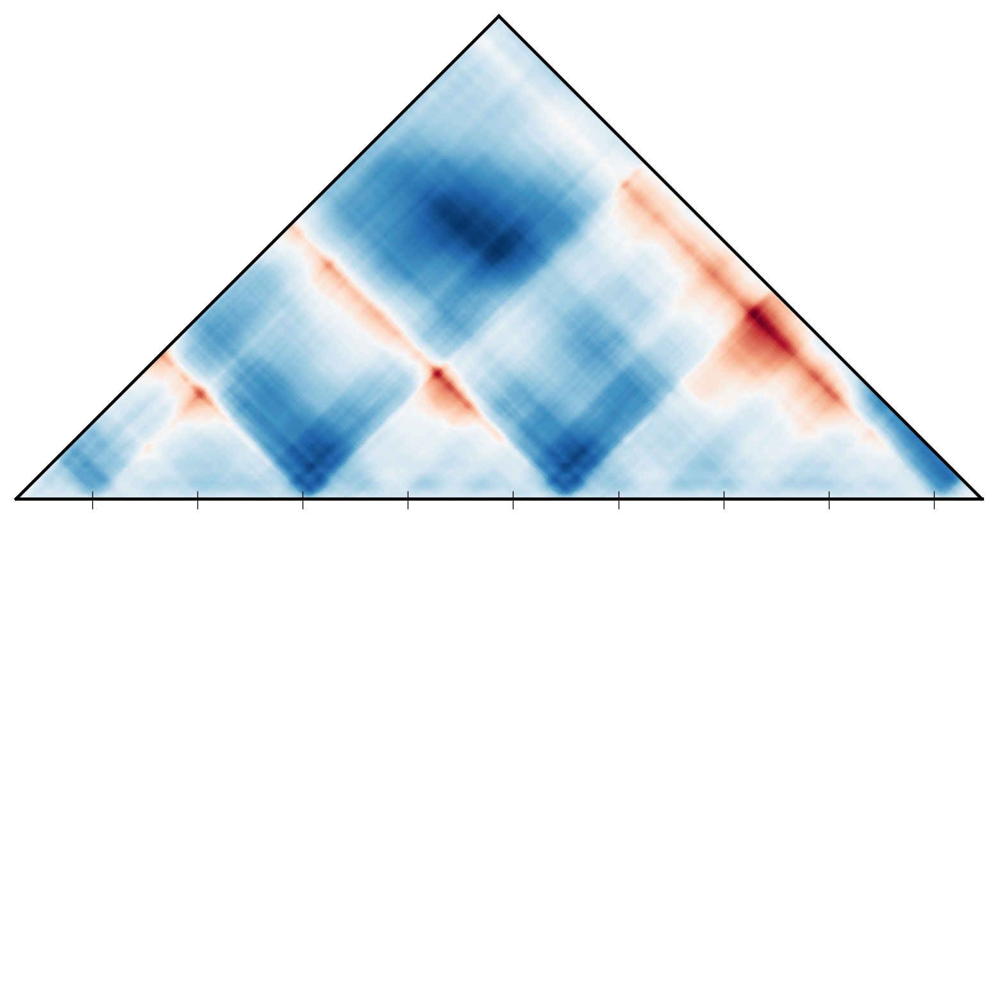

In [9]:
onemap_rotated_no_pos('Clint', 'chr1', 100663296)

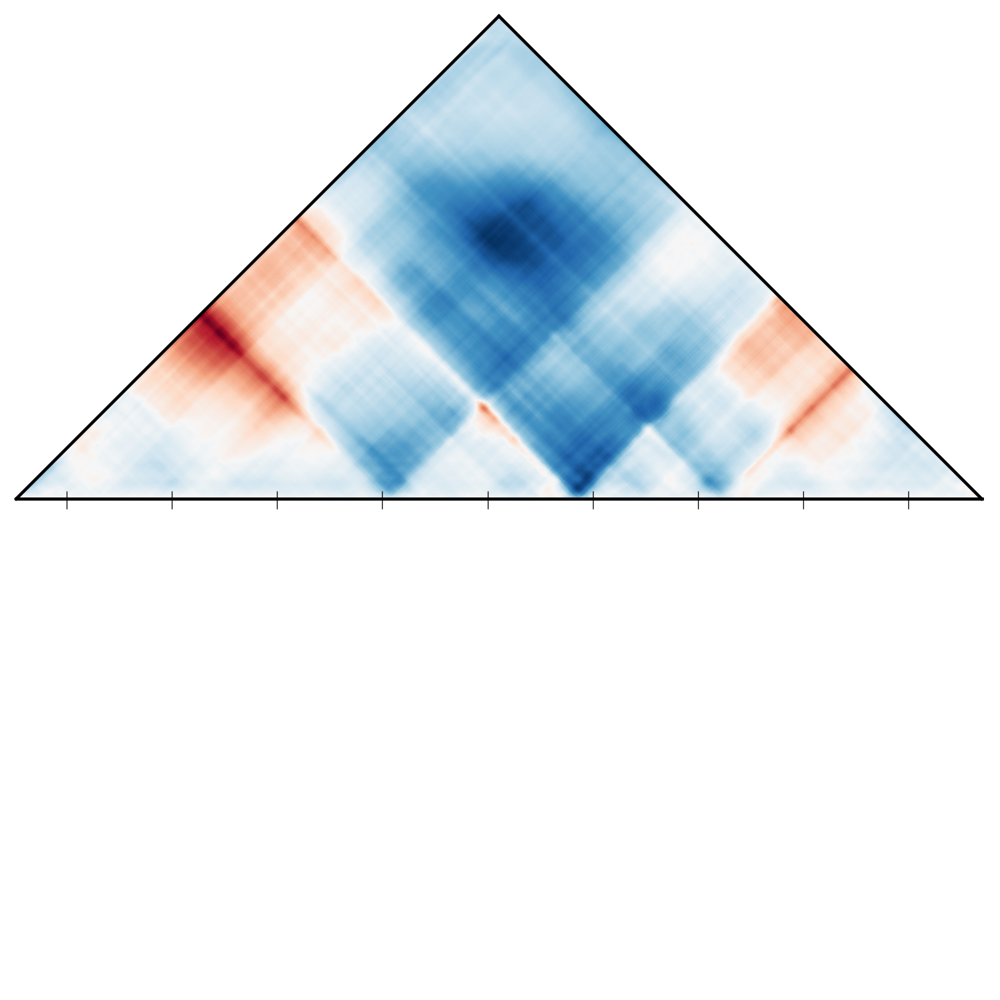

In [10]:
onemap_rotated_no_pos('Clint', 'chr1', 101187584)

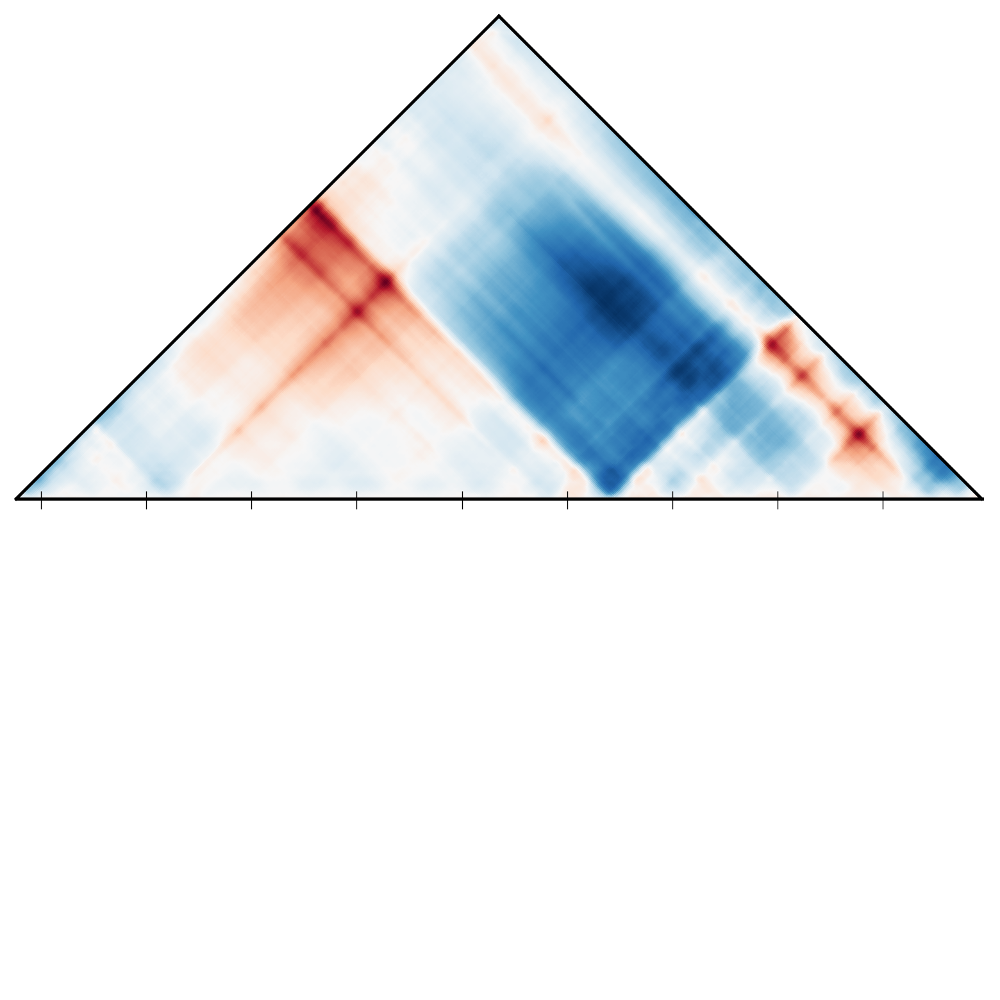

In [11]:
onemap_rotated_no_pos('Clint', 'chr1', 101711872)

## Rotated Map Comparison <a class = 'anchor' id = 'rotatedcomparison'></a>

In [12]:
def map_comparison(ind1, ind2, chr, start, ind1_label, ind2_label):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+15, x-15, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 28)
    
    # subpanel labels
    ax0.text(290, 158, ind1_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 40)
    ax1.text(290, 158, ind2_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 40)
    ax2.text(290, 158, r'$\Delta$', horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 40)
    
    plt.savefig('../plots/map_comparisons/%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight', transparent = True);
    plt.show()

Generate two maps for Figure 1C.

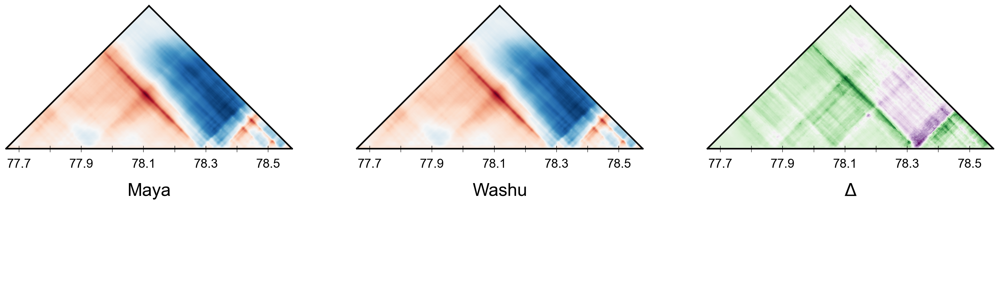

In [13]:
map_comparison('Maya', 'Washu', 'chr4', 77594624, 'Maya', 'Washu')

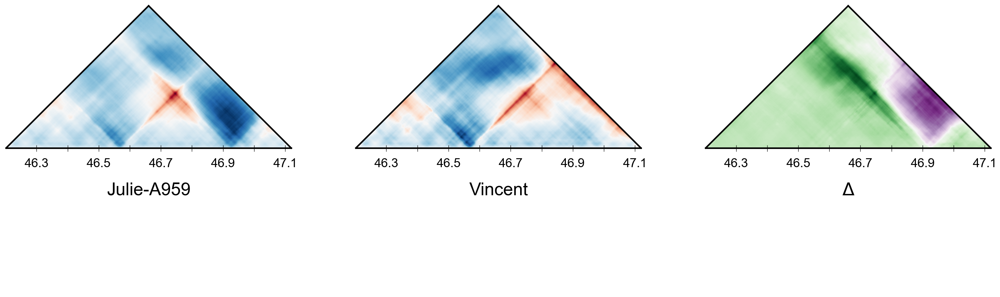

In [14]:
map_comparison('Julie-A959', 'Vincent', 'chr18', 46137344, 'Julie-A959', 'Vincent')

## Rotated Map Comparison for IDWs with Causal Variant <a class = 'anchor' id = 'rotatedcomparisonIDW'></a>

In [15]:
def map_comparison_IDW(ind1, ind2, chr, start, variant):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+15, x-15, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 32)
    
    # arrow
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    for n in subplots:
        n.arrow(x = variant_cell-50, y = variant_cell+50, dx = 40, dy = -40, width = 10, length_includes_head = True, head_length = 17.5, edgecolor = 'black', facecolor = 'black')
    plt.savefig('../plots/map_comparisons/IDW_%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight');
    
    plt.show()

## Rotated Map Comparison for IDWs with Causal Variant and Prediction

In [16]:
def map_comparison_IDW_prediction(ind1, ind2, chr, start, variant):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T
    
    with open('IDWs/IDW_modifying_variant_maps/%s_%s_%s.txt' % (chr,start,variant)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                alt_vector = line.split('\t')
                alt_vector = alt_vector[2:]
    alt_mat = from_upper_triu(alt_vector, 448, 2)
    mask =  np.tri(alt_mat.shape[0], k = -1)
    alt_mat = np.ma.array(alt_mat, mask = mask).T

# plot

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(alt_mat, cmap = 'RdBu_r')
    ax1.matshow(ind1_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat, cmap = 'RdBu_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+15, x-15, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 32)
    
    # variant position
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    # arrow
    #for n in subplots:
    #    n.arrow(x = variant_cell-50, y = variant_cell+50, dx = 40, dy = -40, width = 10, length_includes_head = True, head_length = 17.5, edgecolor = 'black', facecolor = 'black')
    
    for n in subplots:
        n.plot(variant_cell+10, variant_cell-10, color = 'black', marker = '*', markersize = 20)
    
    #plt.savefig('../plots/map_comparisons/IDW_prediction_%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight', transparent = True);
    
    plt.show()

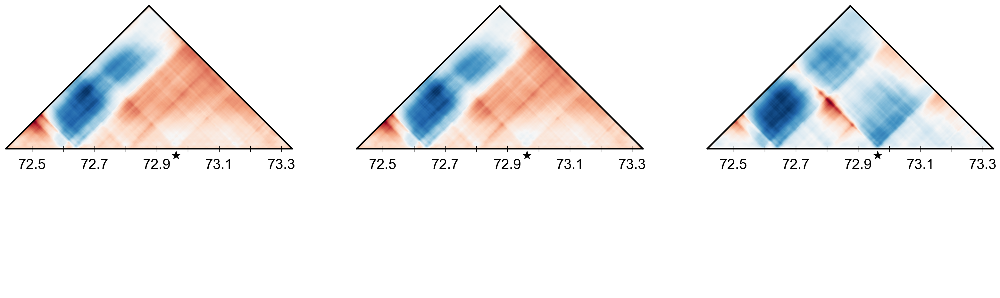

In [17]:
map_comparison_IDW_prediction('Lara', 'Washu', 'chr1', 72351744, 72961982)

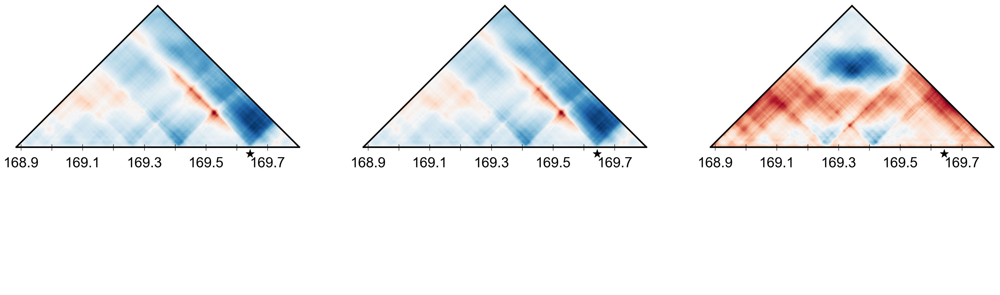

In [18]:
map_comparison_IDW_prediction('Berta', 'Natalie', 'chr1', 168820736, 169642932)

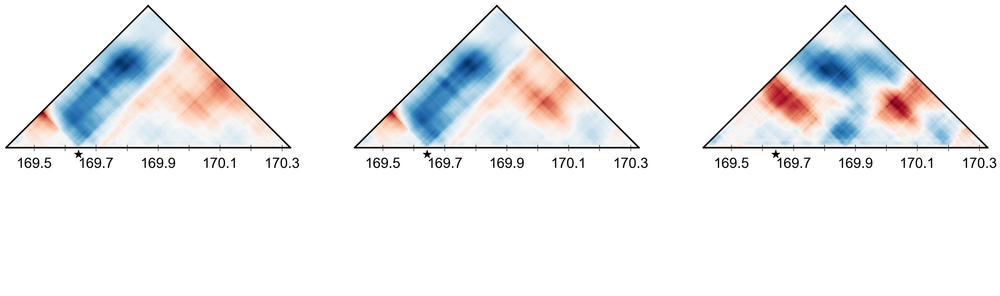

In [19]:
map_comparison_IDW_prediction('Berta', 'Natalie', 'chr1', 169345024, 169642932)

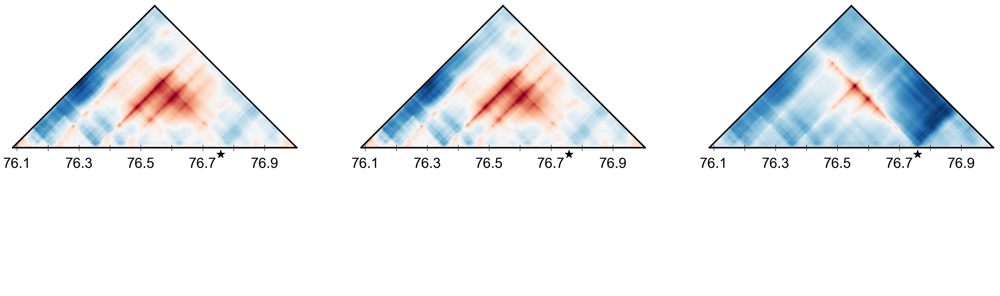

In [20]:
map_comparison_IDW_prediction('Coco-chimp', 'Ula', 'chr2A', 76021760, 76758437)

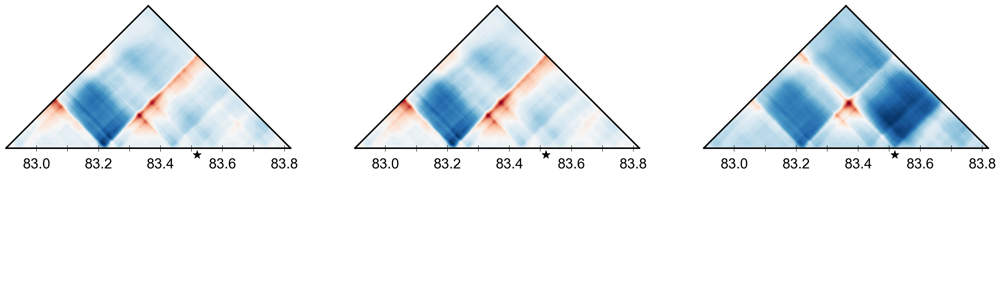

In [21]:
map_comparison_IDW_prediction('Frederike', 'Cindy-verus', 'chr4', 82837504, 83518437)

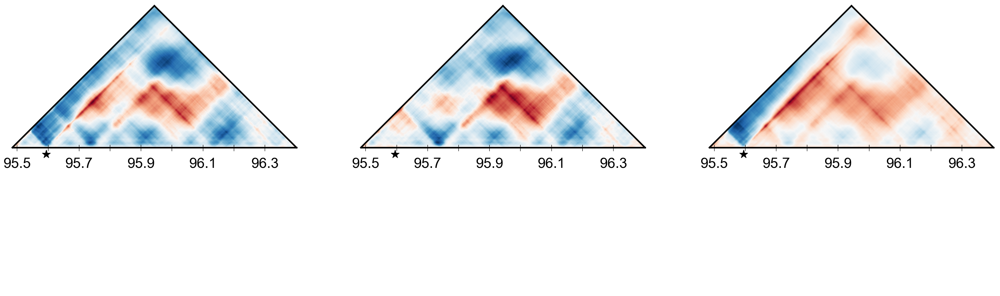

In [22]:
map_comparison_IDW_prediction('Desmond', 'Marlin', 'chr5', 95420416, 95594783)

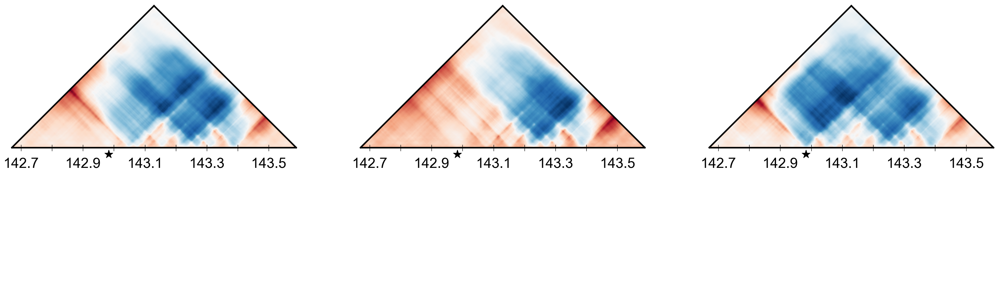

In [23]:
map_comparison_IDW_prediction('Bono', 'Koto', 'chr6', 142606336, 142982723)

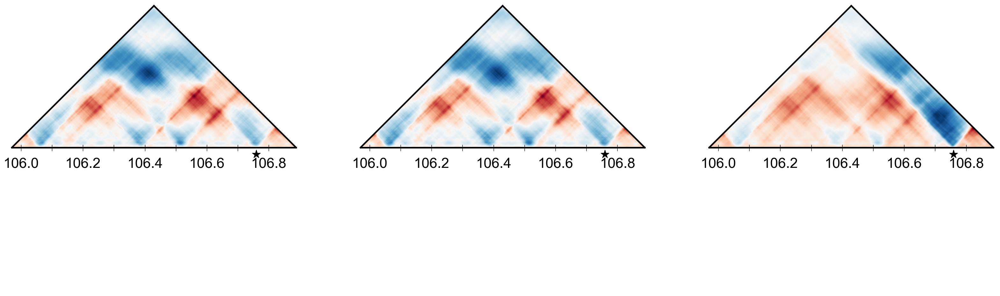

In [24]:
map_comparison_IDW_prediction('Alice', 'Bihati', 'chr7', 105906176, 106759710)

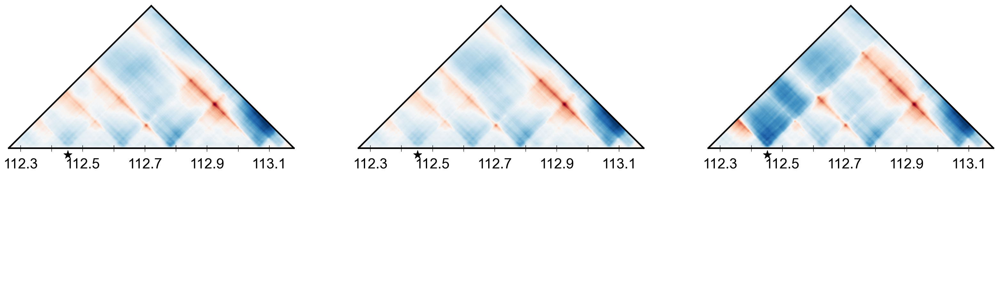

In [25]:
map_comparison_IDW_prediction('Athanga', 'Bosco', 'chr8', 112197632, 112452222)

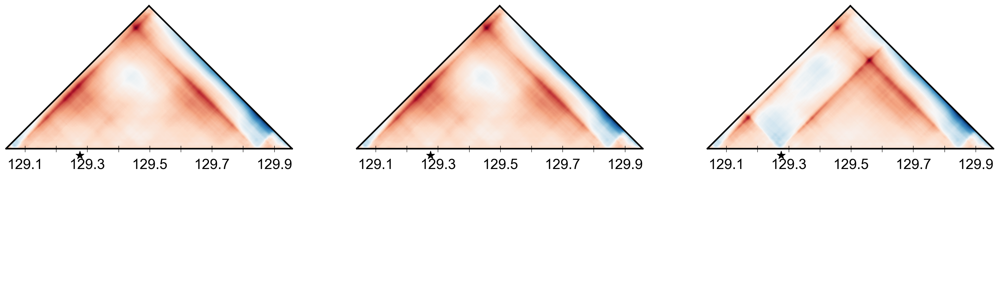

In [26]:
map_comparison_IDW_prediction('Damian', 'Negrita', 'chr8', 128974848, 129275883)

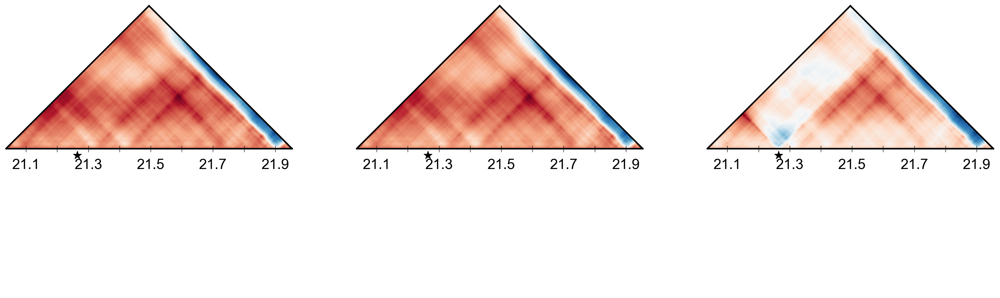

In [27]:
map_comparison_IDW_prediction('Jimmie', 'Tibe', 'chr11', 20971520, 21264409)

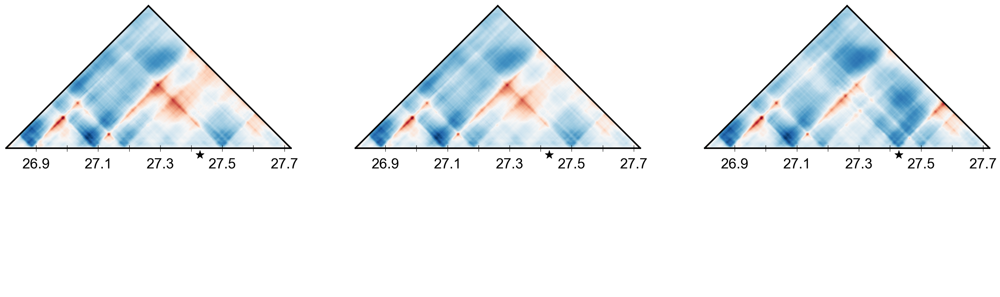

In [28]:
map_comparison_IDW_prediction('Luky', 'Cleo', 'chr14', 26738688, 27428014)

## Rotated Map Comparison for IDWs with Causal Variant and Tracks <a class = 'anchor' id = 'rotatedcomparisonIDWtracks'></a>

In [29]:
def map_comparison_IDW_tracks(ind1, ind2, chr, start, variant):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+18, x-18, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 24)
    
    # variant position
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    # arrow
    #for n in subplots:
    #    n.arrow(x = variant_cell-50, y = variant_cell+50, dx = 40, dy = -40, width = 10, length_includes_head = True, head_length = 17.5, edgecolor = 'black', facecolor = 'black')
    
    for n in subplots:
        n.plot(variant_cell+10, variant_cell-10, color = 'black', marker = '*', markersize = 20)
    
    # exons
    map_x_max = (start+((2**20)-65536))
    exons = pd.read_csv('annotations/panTro6_exons.bed', sep = '\t', header = None, names = ['chr','start','end','gene'])
    exons = exons[(exons['chr'] == chr) & (exons['start'] >= start) & (exons['start'] < start+((2**20)-65536))]
    exons['end'].values[exons['end'] > map_x_max] = map_x_max
    exons['start'] = (exons['start'] - (start + 65536)) / 2048
    exons['end'] = (exons['end'] - (start + 65536)) / 2048
    exons['length'] = exons['end'] - exons['start']
    exon_genes = pd.unique(exons['gene']).tolist()
    exon_starts = exons['start'].values.tolist()
    exon_lengths = exons['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(exon_starts, exon_lengths):
            n.add_patch(Rectangle((x+100, x-100), width = y, height = 25, angle = 45, color = 'black', lw = 2))
    
    # genes
    genes = pd.read_csv('annotations/panTro6_genes.bed', sep = '\t', header = None, names = ['chr','start','end','transcript','gene'])
    genes = genes[genes['gene'].isin(exon_genes)]
    map_x_min = (start+65536)
    
    genes['start'].values[genes['end'] < map_x_min] = map_x_min
    genes['end'].values[genes['end'] > map_x_max] = map_x_max
    genes['start'] = (genes['start'] - (start + 65536)) / 2048
    genes['end'] = (genes['end'] - (start + 65536)) / 2048
    
    exon_min = exons.groupby(['gene'])['start'].min().to_frame('min').reset_index()
    exon_max = exons.groupby(['gene'])['end'].max().to_frame('max').reset_index()
    exon_min_max = pd.merge(exon_min, exon_max, on = 'gene')
    exon_min = pd.Series(exon_min_max['min'].values, index = exon_min_max['gene']).to_dict()
    exon_max = pd.Series(exon_min_max['max'].values, index = exon_min_max['gene']).to_dict()
    
    genes['start'].values[genes['end'] >= 0] = genes['gene'].map(exon_min)
    genes['end'].values[genes['end'] <= 448] = genes['gene'].map(exon_max)
  
    genes['length'] = genes['end'] - genes['start']
    gene_starts = genes['start'].values.tolist()
    gene_lengths = genes['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(gene_starts, gene_lengths):
            n.plot([(x+90), ((x+y)+90)],[(x-90), ((x+y)-90)], color = 'black') # line will default to bottom of exon rectangle so adjust coordinates if exon height changes
    
    # gene names
    gene_midpoints = (genes['length']/2) + genes['start'].values.tolist()
    
    for n in subplots:
        for x, y in zip(gene_midpoints, exon_genes):
            n.text(x+110, x-110, y, horizontalalignment = 'center', verticalalignment = 'top', style = 'italic', fontsize = 16)
    
    # CTCF
    CTCF = pd.read_csv('annotations/panTro6_CTCF.bed', sep = '\t', header = None, names = ['chr','start','end','score','18359_overlap','36222_overlap','EB176_overlap'])
    CTCF = CTCF[(CTCF['chr'] == chr) & (CTCF['start'] >= start) & (CTCF['start'] < start+((2**20)-65536))]
    CTCF['end'].values[CTCF['end'] > map_x_max] = map_x_max
    CTCF['start'] = (CTCF['start'] - (start + 65536)) / 2048
    CTCF['end'] = (CTCF['end'] - (start + 65536)) / 2048
    CTCF['length'] = CTCF['end'] - CTCF['start']
    CTCF_starts = CTCF['start'].values.tolist()
    CTCF_lengths = CTCF['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(CTCF_starts, CTCF_lengths):
            n.add_patch(Rectangle((x+65, x-65), width = y, height = 25, angle = 45, color = 'firebrick', lw = 2))
    
    
    # track labels
    ax0.text(50, -70, 'CTCF', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    ax0.text(85, -105, 'Genes', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    
    plt.savefig('../plots/map_comparisons/IDW_%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight');
    plt.show()

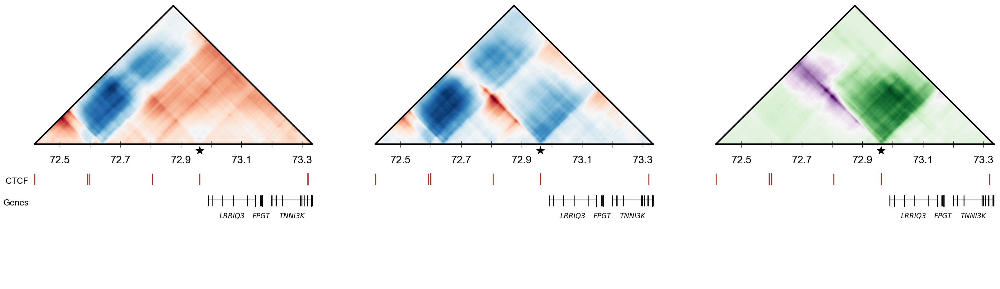

In [30]:
map_comparison_IDW_tracks('Lara', 'Washu', 'chr1', 72351744, 72961982)

In [13]:
def map_comparison_IDW_tracks(ind1, ind2, chr, start, variant, ind1_label, ind2_label):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+18, x-18, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 24)
    
    # variant position
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    # arrow
    #for n in subplots:
    #    n.arrow(x = variant_cell-50, y = variant_cell+50, dx = 40, dy = -40, width = 10, length_includes_head = True, head_length = 17.5, edgecolor = 'black', facecolor = 'black')
    
    for n in subplots:
        n.plot(variant_cell+10, variant_cell-10, color = 'black', marker = '*', markersize = 20)
    
    # exons
    map_x_max = (start+((2**20)-65536))
    exons = pd.read_csv('annotations/panTro6_exons.bed', sep = '\t', header = None, names = ['chr','start','end','gene'])
    exons = exons[(exons['chr'] == chr) & (exons['start'] >= start) & (exons['start'] < start+((2**20)-65536))]
    exons['end'].values[exons['end'] > map_x_max] = map_x_max
    exons['start'] = (exons['start'] - (start + 65536)) / 2048
    exons['end'] = (exons['end'] - (start + 65536)) / 2048
    exons['length'] = exons['end'] - exons['start']
    exon_genes = pd.unique(exons['gene']).tolist()
    exon_starts = exons['start'].values.tolist()
    exon_lengths = exons['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(exon_starts, exon_lengths):
            n.add_patch(Rectangle((x+65, x-65), width = y, height = 25, angle = 45, color = 'black', lw = 2))
    
    # genes
    genes = pd.read_csv('annotations/panTro6_genes.bed', sep = '\t', header = None, names = ['chr','start','end','transcript','gene'])
    genes = genes[genes['gene'].isin(exon_genes)]
    map_x_min = (start+65536)
    
    genes['start'].values[genes['end'] < map_x_min] = map_x_min
    genes['end'].values[genes['end'] > map_x_max] = map_x_max
    genes['start'] = (genes['start'] - (start + 65536)) / 2048
    genes['end'] = (genes['end'] - (start + 65536)) / 2048
    
    exon_min = exons.groupby(['gene'])['start'].min().to_frame('min').reset_index()
    exon_max = exons.groupby(['gene'])['end'].max().to_frame('max').reset_index()
    exon_min_max = pd.merge(exon_min, exon_max, on = 'gene')
    exon_min = pd.Series(exon_min_max['min'].values, index = exon_min_max['gene']).to_dict()
    exon_max = pd.Series(exon_min_max['max'].values, index = exon_min_max['gene']).to_dict()
    
    genes['start'].values[genes['end'] >= 0] = genes['gene'].map(exon_min)
    genes['end'].values[genes['end'] <= 448] = genes['gene'].map(exon_max)
  
    genes['length'] = genes['end'] - genes['start']
    gene_starts = genes['start'].values.tolist()
    gene_lengths = genes['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(gene_starts, gene_lengths):
            n.plot([(x+55), ((x+y)+55)],[(x-55), ((x+y)-55)], color = 'black') # line will default to bottom of exon rectangle so adjust coordinates if exon height changes
    
    # gene names
    gene_midpoints = (genes['length']/2) + genes['start'].values.tolist()
    
    for n in subplots:
        for x, y in zip(gene_midpoints, exon_genes):
            n.text(x+72, x-72, y, horizontalalignment = 'center', verticalalignment = 'top', style = 'italic', fontsize = 16)
    
    # Promoters
    promoters = pd.read_csv('annotations/panTro6_promoters.bed', sep = '\t', header = None, names = ['chr','start','end','replicate_1','replicate_2','regulatory_state','regulatory_component','genes'])
    promoters = promoters[(promoters['chr'] == chr) & (promoters['start'] >= start) & (promoters['start'] < start+((2**20)-65536))]
    promoters['end'].values[promoters['end'] > map_x_max] = map_x_max
    promoters['start'] = (promoters['start'] - (start + 65536)) / 2048
    promoters['end'] = (promoters['end'] - (start + 65536)) / 2048
    promoters['length'] = promoters['end'] - promoters['start']
    promoters_starts = promoters['start'].values.tolist()
    promoters_lengths = promoters['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(promoters_starts, promoters_lengths):
            n.add_patch(Rectangle((x+120, x-120), width = y, height = 25, angle = 45, color = 'blue', lw = 2))
    
    # Enhancers
    enhancers = pd.read_csv('annotations/panTro6_enhancers.bed', sep = '\t', header = None, names = ['chr','start','end','replicate_1','replicate_2','regulatory_state','regulatory_component','genes'])
    enhancers = enhancers[(enhancers['chr'] == chr) & (enhancers['start'] >= start) & (enhancers['start'] < start+((2**20)-65536))]
    enhancers['end'].values[enhancers['end'] > map_x_max] = map_x_max
    enhancers['start'] = (enhancers['start'] - (start + 65536)) / 2048
    enhancers['end'] = (enhancers['end'] - (start + 65536)) / 2048
    enhancers['length'] = enhancers['end'] - enhancers['start']
    enhancers_starts = enhancers['start'].values.tolist()
    enhancers_lengths = enhancers['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(enhancers_starts, enhancers_lengths):
            n.add_patch(Rectangle((x+145, x-145), width = y, height = 25, angle = 45, color = 'green', lw = 2))
    
    # CTCF
    CTCF = pd.read_csv('annotations/panTro6_CTCF.bed', sep = '\t', header = None, names = ['chr','start','end','score','18359_overlap','36222_overlap','EB176_overlap'])
    CTCF = CTCF[(CTCF['chr'] == chr) & (CTCF['start'] >= start) & (CTCF['start'] < start+((2**20)-65536))]
    CTCF['end'].values[CTCF['end'] > map_x_max] = map_x_max
    CTCF['start'] = (CTCF['start'] - (start + 65536)) / 2048
    CTCF['end'] = (CTCF['end'] - (start + 65536)) / 2048
    CTCF['length'] = CTCF['end'] - CTCF['start']
    CTCF_starts = CTCF['start'].values.tolist()
    CTCF_lengths = CTCF['length'].values.tolist()
    
    for n in subplots:
        for x, y in zip(CTCF_starts, CTCF_lengths):
            n.add_patch(Rectangle((x+170, x-170), width = y, height = 25, angle = 45, color = 'firebrick', lw = 2))
    
    # track labels
    ax0.text(47.5, -67.5, 'Genes', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    ax0.text(102.5, -122.5, 'Promoters', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    ax0.text(127.5, -147.5, 'Enhancers', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    ax0.text(152.5, -172.5, 'CTCF', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 20)
    
    # subpanel labels
    ax0.text(448, 0, ind1_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    ax1.text(448, 0, ind2_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    ax2.text(448, 0, r'$\Delta$', horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    
    #plt.savefig('../plots/map_comparisons/IDW_%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight', transparent = True);
    plt.show()

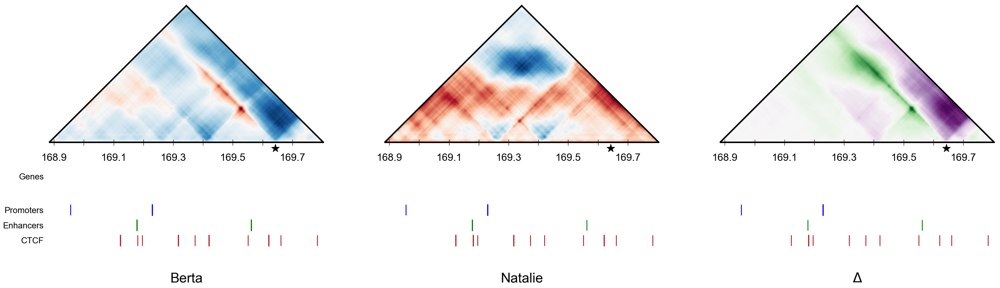

In [18]:
map_comparison_IDW_tracks('Berta', 'Natalie', 'chr1', 168820736, 169642932, 'Berta', 'Natalie')

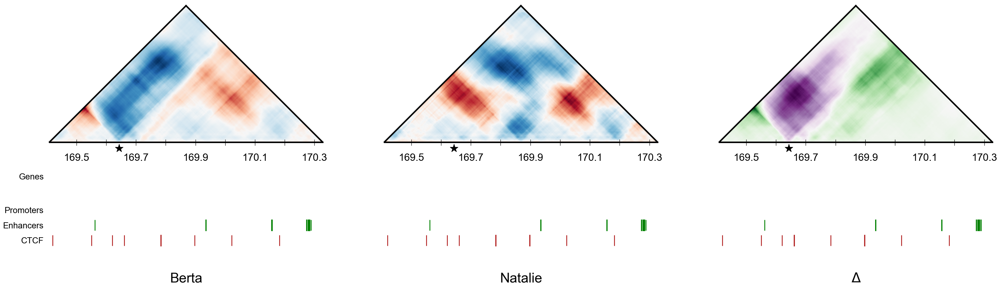

In [19]:
map_comparison_IDW_tracks('Berta', 'Natalie', 'chr1', 169345024, 169642932, 'Berta', 'Natalie')

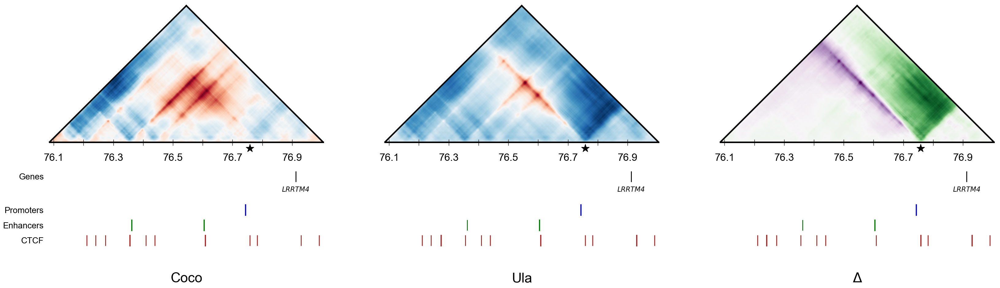

In [20]:
map_comparison_IDW_tracks('Coco-chimp', 'Ula', 'chr2A', 76021760, 76758437, 'Coco', 'Ula')

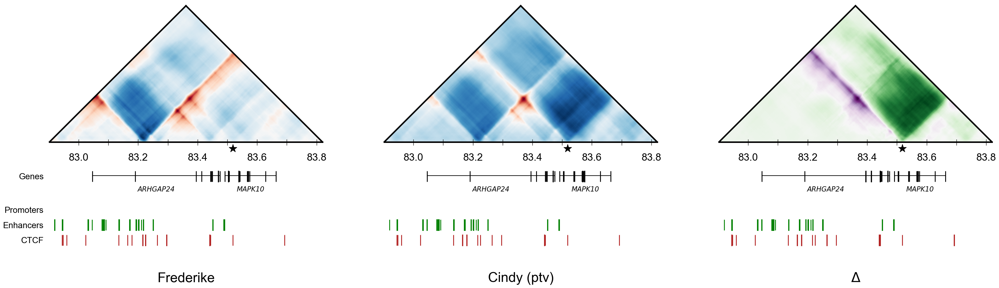

In [21]:
map_comparison_IDW_tracks('Frederike', 'Cindy-verus', 'chr4', 82837504, 83518437, 'Frederike', 'Cindy (ptv)')

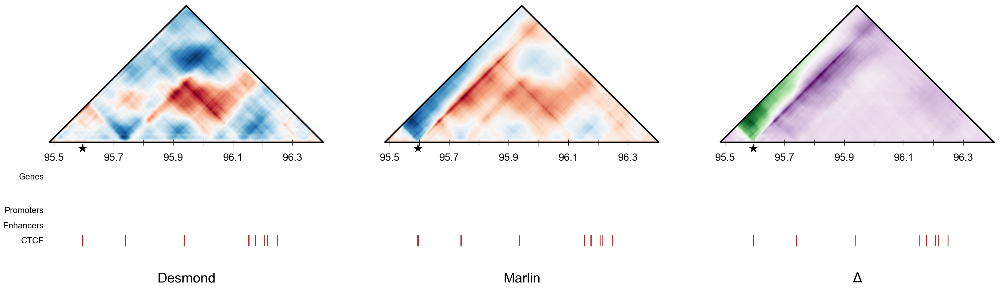

In [22]:
map_comparison_IDW_tracks('Desmond', 'Marlin', 'chr5', 95420416, 95594783, 'Desmond', 'Marlin')

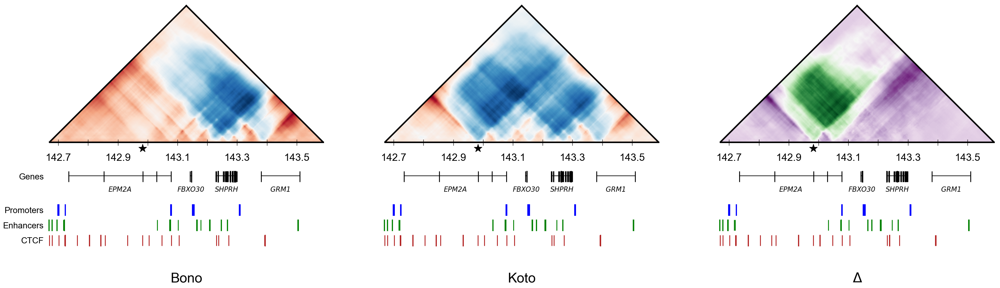

In [23]:
map_comparison_IDW_tracks('Bono', 'Koto', 'chr6', 142606336, 142982723, 'Bono', 'Koto')

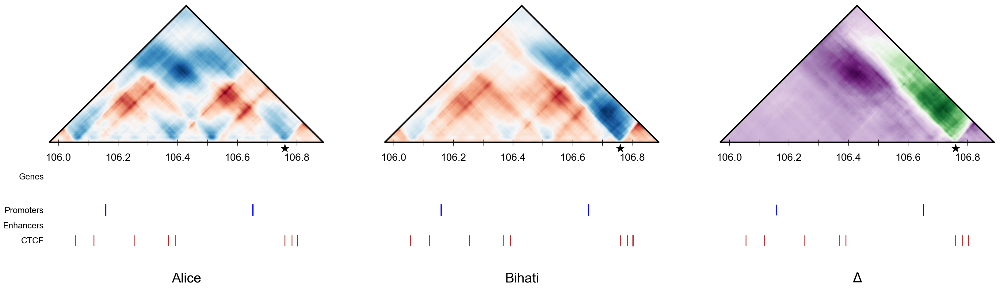

In [24]:
map_comparison_IDW_tracks('Alice', 'Bihati', 'chr7', 105906176, 106759710, 'Alice', 'Bihati')

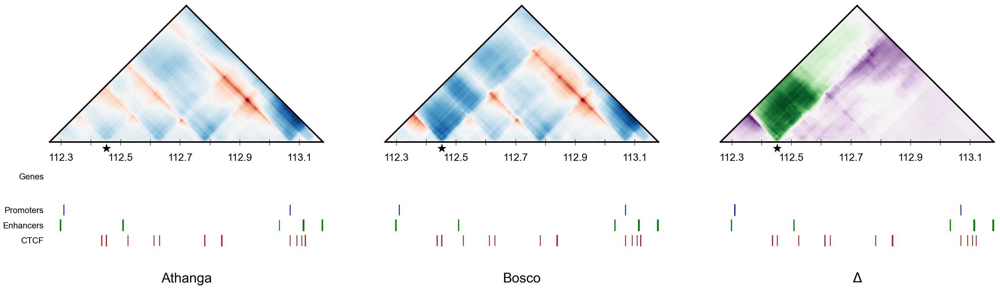

In [25]:
map_comparison_IDW_tracks('Athanga', 'Bosco', 'chr8', 112197632, 112452222, 'Athanga', 'Bosco')

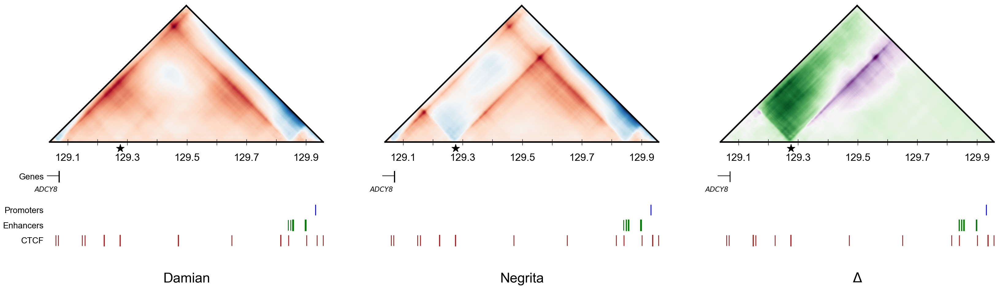

In [26]:
map_comparison_IDW_tracks('Damian', 'Negrita', 'chr8', 128974848, 129275883, 'Damian', 'Negrita')

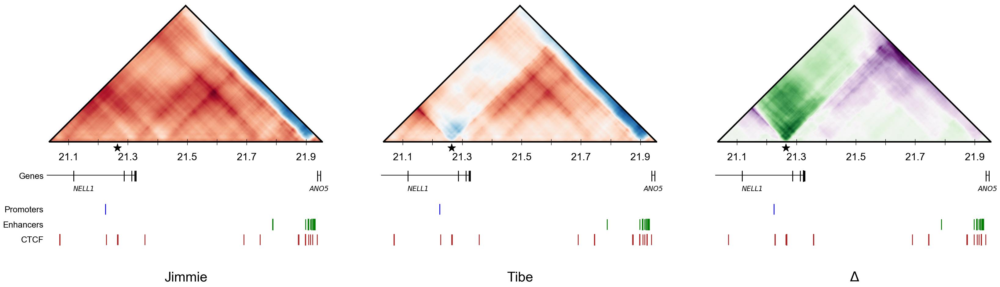

In [27]:
map_comparison_IDW_tracks('Jimmie', 'Tibe', 'chr11', 20971520, 21264409, 'Jimmie', 'Tibe')

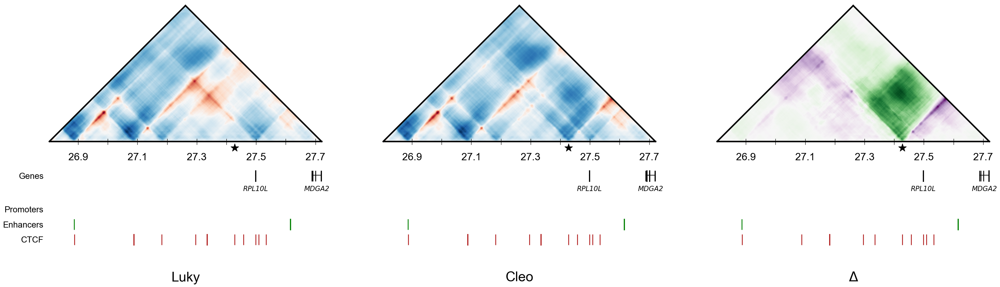

In [28]:
map_comparison_IDW_tracks('Luky', 'Cleo', 'chr14', 26738688, 27428014, 'Luky', 'Cleo')

Let's modify the function to generate an example for Figure 2.

In [56]:
def map_comparison_IDW_tracks_for_figure(ind1, ind2, chr, start, variant, ind1_label, ind2_label):
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind1)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind1_vector = line.split('\t')
                ind1_vector = ind1_vector[2:]
    ind1_mat = from_upper_triu(ind1_vector, 448, 2)
    mask =  np.tri(ind1_mat.shape[0], k = -1)
    ind1_mat = np.ma.array(ind1_mat, mask = mask).T
    
    with open('predictions/HFF/3d_predictions_%s.txt' % (ind2)) as file:
        lines = [ line.strip() for line in file ]
        for line in lines:
            if '%s' % (chr) in line and '%s' % (start) in line:
                ind2_vector = line.split('\t')
                ind2_vector = ind2_vector[2:]
    ind2_mat = from_upper_triu(ind2_vector, 448, 2)
    mask =  np.tri(ind2_mat.shape[0], k = -1)
    ind2_mat = np.ma.array(ind2_mat, mask = mask).T

    fig1, axes=plt.subplots(3, figsize=(40,20))
    
    fig1.delaxes(axes[0])
    fig1.delaxes(axes[1])
    fig1.delaxes(axes[2])
    
    ax0 = setup_axes1(fig1, 131, -45)
    ax1 = setup_axes1(fig1, 132, -45)
    ax2 = setup_axes1(fig1, 133, -45)
    
    ax0.matshow(ind1_mat, cmap = 'RdBu_r')
    ax1.matshow(ind2_mat, cmap = 'RdBu_r')
    ax2.matshow(ind2_mat - ind1_mat, cmap = 'PRGn_r')
    
    subplots = [ax0,ax1,ax2]
    
    # add border to map
    for n in subplots:
        n.plot([-1, 447], [0, 448], color = 'black', linewidth = 3.5) # bottom line
        n.plot([-1, 447], [448, 448], color = 'black', linewidth = 3.5) # right line
        n.plot([-1, -1], [448, 0], color = 'black', linewidth = 3.5) # left line
    
    # add 'x-axis' ticks
    first = start + 65536
    rounded = math.ceil(first / 100000) * 100000
    diff = rounded - first
    cell = diff/2048
    
    x_list = np.arange(cell, 440, (100000/2048))
        
    for n in subplots:
        for x in x_list:
            n.plot(x, x, color = 'black', marker = '|', markersize = 15)
    
    # add 'x-axis' labels
    y_list = np.arange((rounded/1000000), ((rounded/1000000)+0.9), 0.1)
    for n in subplots:
        for x, y in zip(x_list[::2], (y_list[::2])):
            n.text(x+18, x-18, '%.1f' % y, horizontalalignment = 'center', verticalalignment = 'top', fontproperties = arial, fontsize = 28)
    
    # variant position
    variant_diff = variant - first
    variant_cell = variant_diff/2048
    
    # arrow
    #for n in subplots:
    #    n.arrow(x = variant_cell-50, y = variant_cell+50, dx = 40, dy = -40, width = 10, length_includes_head = True, head_length = 17.5, edgecolor = 'black', facecolor = 'black')
    
    for n in subplots:
        n.plot(variant_cell+10, variant_cell-10, color = 'black', marker = '*', markersize = 22)
    
    # exons
    map_x_max = (start+((2**20)-65536))
    exons = pd.read_csv('annotations/panTro6_exons.bed', sep = '\t', header = None, names = ['chr','start','end','gene'])
    exons = exons[(exons['chr'] == chr) & (exons['start'] >= start) & (exons['start'] < start+((2**20)-65536))]
    exons['end'].values[exons['end'] > map_x_max] = map_x_max
    exons['start'] = (exons['start'] - (start + 65536)) / 2048
    exons['end'] = (exons['end'] - (start + 65536)) / 2048
    exons['length'] = exons['end'] - exons['start']
    exon_genes = pd.unique(exons['gene']).tolist()
    exon_starts = exons['start'].values.tolist()
    exon_lengths = exons['length'].values.tolist()
    
    
    for x, y in zip(exon_starts, exon_lengths):
        ax2.add_patch(Rectangle((x+75, x-75), width = y, height = 25, angle = 45, color = 'black', lw = 2))
    
    # genes
    genes = pd.read_csv('annotations/panTro6_genes.bed', sep = '\t', header = None, names = ['chr','start','end','transcript','gene'])
    genes = genes[genes['gene'].isin(exon_genes)]
    map_x_min = (start+65536)
    
    genes['start'].values[genes['end'] < map_x_min] = map_x_min
    genes['end'].values[genes['end'] > map_x_max] = map_x_max
    genes['start'] = (genes['start'] - (start + 65536)) / 2048
    genes['end'] = (genes['end'] - (start + 65536)) / 2048
    
    exon_min = exons.groupby(['gene'])['start'].min().to_frame('min').reset_index()
    exon_max = exons.groupby(['gene'])['end'].max().to_frame('max').reset_index()
    exon_min_max = pd.merge(exon_min, exon_max, on = 'gene')
    exon_min = pd.Series(exon_min_max['min'].values, index = exon_min_max['gene']).to_dict()
    exon_max = pd.Series(exon_min_max['max'].values, index = exon_min_max['gene']).to_dict()
    
    genes['start'].values[genes['end'] >= 0] = genes['gene'].map(exon_min)
    genes['end'].values[genes['end'] <= 448] = genes['gene'].map(exon_max)
  
    genes['length'] = genes['end'] - genes['start']
    gene_starts = genes['start'].values.tolist()
    gene_lengths = genes['length'].values.tolist()
    
    
    for x, y in zip(gene_starts, gene_lengths):
        ax2.plot([(x+65), ((x+y)+65)],[(x-65), ((x+y)-65)], color = 'black') # line will default to bottom of exon rectangle so adjust coordinates if exon height changes
    
    # gene names
    gene_midpoints = (genes['length']/2) + genes['start'].values.tolist()
    
    for x, y in zip(gene_midpoints, exon_genes):
        ax2.text(x+80, x-80, y, horizontalalignment = 'center', verticalalignment = 'top', style = 'italic', fontsize = 20)
    
    # Promoters
    promoters = pd.read_csv('annotations/panTro6_promoters.bed', sep = '\t', header = None, names = ['chr','start','end','replicate_1','replicate_2','regulatory_state','regulatory_component','genes'])
    promoters = promoters[(promoters['chr'] == chr) & (promoters['start'] >= start) & (promoters['start'] < start+((2**20)-65536))]
    promoters['end'].values[promoters['end'] > map_x_max] = map_x_max
    promoters['start'] = (promoters['start'] - (start + 65536)) / 2048
    promoters['end'] = (promoters['end'] - (start + 65536)) / 2048
    promoters['length'] = promoters['end'] - promoters['start']
    promoters_starts = promoters['start'].values.tolist()
    promoters_lengths = promoters['length'].values.tolist()
    
    for x, y in zip(promoters_starts, promoters_lengths):
        ax2.add_patch(Rectangle((x+130, x-130), width = y, height = 25, angle = 45, color = 'grey', lw = 2))
    
    # Enhancers
    enhancers = pd.read_csv('annotations/panTro6_enhancers.bed', sep = '\t', header = None, names = ['chr','start','end','replicate_1','replicate_2','regulatory_state','regulatory_component','genes'])
    enhancers = enhancers[(enhancers['chr'] == chr) & (enhancers['start'] >= start) & (enhancers['start'] < start+((2**20)-65536))]
    enhancers['end'].values[enhancers['end'] > map_x_max] = map_x_max
    enhancers['start'] = (enhancers['start'] - (start + 65536)) / 2048
    enhancers['end'] = (enhancers['end'] - (start + 65536)) / 2048
    enhancers['length'] = enhancers['end'] - enhancers['start']
    enhancers_starts = enhancers['start'].values.tolist()
    enhancers_lengths = enhancers['length'].values.tolist()
    

    for x, y in zip(enhancers_starts, enhancers_lengths):
        ax2.add_patch(Rectangle((x+155, x-155), width = y, height = 25, angle = 45, color = 'grey', lw = 2))
    
    # CTCF
    CTCF = pd.read_csv('annotations/panTro6_CTCF.bed', sep = '\t', header = None, names = ['chr','start','end','score','18359_overlap','36222_overlap','EB176_overlap'])
    CTCF = CTCF[(CTCF['chr'] == chr) & (CTCF['start'] >= start) & (CTCF['start'] < start+((2**20)-65536))]
    CTCF['end'].values[CTCF['end'] > map_x_max] = map_x_max
    CTCF['start'] = (CTCF['start'] - (start + 65536)) / 2048
    CTCF['end'] = (CTCF['end'] - (start + 65536)) / 2048
    CTCF['length'] = CTCF['end'] - CTCF['start']
    CTCF_starts = CTCF['start'].values.tolist()
    CTCF_lengths = CTCF['length'].values.tolist()
    

    for x, y in zip(CTCF_starts, CTCF_lengths):
        ax2.add_patch(Rectangle((x+180, x-180), width = y, height = 25, angle = 45, color = 'grey', lw = 2))
    
    # track labels
    ax2.text(47.5, -87.5, 'Genes', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 24)
    ax2.text(102.5, -142.5, 'Promoters', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 24)
    ax2.text(127.5, -167.5, 'Enhancers', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 24)
    ax2.text(152.5, -192.5, 'CTCF', horizontalalignment = 'right', verticalalignment = 'center', fontproperties = arial, fontsize = 24)
    
    # subpanel labels
    #ax0.text(448, 0, ind1_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    #ax1.text(448, 0, ind2_label, horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    #ax2.text(448, 0, r'$\Delta$', horizontalalignment = 'center', verticalalignment = 'center', fontproperties = arial, fontsize = 32)
    
    plt.savefig('../plots/map_comparisons/IDW_%s_%s_%s_%s.pdf' % (ind1, ind2, chr, start), bbox_inches = 'tight', transparent = True);
    plt.show()

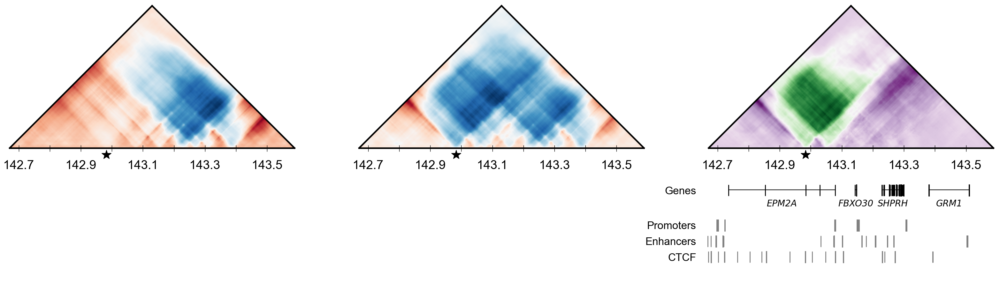

In [57]:
map_comparison_IDW_tracks_for_figure('Bono', 'Koto', 'chr6', 142606336, 142982723, 'Bono', 'Koto')